In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/store-sales-time-series-forecasting/oil.csv
/kaggle/input/store-sales-time-series-forecasting/sample_submission.csv
/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv
/kaggle/input/store-sales-time-series-forecasting/stores.csv
/kaggle/input/store-sales-time-series-forecasting/train.csv
/kaggle/input/store-sales-time-series-forecasting/test.csv
/kaggle/input/store-sales-time-series-forecasting/transactions.csv


In [2]:
import os
import gc
import warnings

#pacf abd acf
import statsmodels.api as sm

#visualization

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

#configs

pd.set_option('display.max_columns',None)
pd.options.display.float_format='{:.2f}'.format
warnings.filterwarnings('ignore')

In [3]:
train=pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/train.csv')
test=pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/test.csv')
stores=pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/stores.csv')
transactions = pd.read_csv("../input/store-sales-time-series-forecasting/transactions.csv")

In [4]:
train.info(),test.info(),stores.info(),transactions.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000888 entries, 0 to 3000887
Data columns (total 6 columns):
 #   Column       Dtype  
---  ------       -----  
 0   id           int64  
 1   date         object 
 2   store_nbr    int64  
 3   family       object 
 4   sales        float64
 5   onpromotion  int64  
dtypes: float64(1), int64(3), object(2)
memory usage: 137.4+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28512 entries, 0 to 28511
Data columns (total 5 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   id           28512 non-null  int64 
 1   date         28512 non-null  object
 2   store_nbr    28512 non-null  int64 
 3   family       28512 non-null  object
 4   onpromotion  28512 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 1.1+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54 entries, 0 to 53
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------

(None, None, None, None)

In [5]:
#datatypes

train['date']=pd.to_datetime(train.date)
train['store_nbr']=train.store_nbr.astype('int8')
train.onpromotion = train.onpromotion.astype('float16')
train.sales=train.sales.astype('float32')

test['date']=pd.to_datetime(test.date)
test['store_nbr']=test.store_nbr.astype('int8')
test.onpromotion = test.onpromotion.astype('float16')

stores.cluster = stores.cluster.astype("int8")
stores.store_nbr=stores.store_nbr.astype('int8')

transactions['date']=pd.to_datetime(transactions.date)
transactions.store_nbr=transactions.store_nbr.astype('int8')


# transaction


In [6]:
transactions.sort_values(['store_nbr','date']).head(10)

,date,store_nbr,transactions
1,2013-01-02,1,2111
47,2013-01-03,1,1833
93,2013-01-04,1,1863
139,2013-01-05,1,1509
185,2013-01-06,1,520
231,2013-01-07,1,1807
277,2013-01-08,1,1869
323,2013-01-09,1,1910
369,2013-01-10,1,1679
415,2013-01-11,1,1813


In [7]:
temp=pd.merge(train.groupby(['date','store_nbr']).sales.sum(),transactions,how='left',on=['date','store_nbr'])
temp

,date,store_nbr,sales,transactions
0,2013-01-01,1,0.00,NaN
1,2013-01-01,2,0.00,NaN
2,2013-01-01,3,0.00,NaN
3,2013-01-01,4,0.00,NaN
4,2013-01-01,5,0.00,NaN
...,...,...,...,...
90931,2017-08-15,50,16879.12,2804.00
90932,2017-08-15,51,20154.56,1573.00
90933,2017-08-15,52,18600.04,2255.00
90934,2017-08-15,53,8208.19,932.00


spearman correlation finds out monotonic relationships unlike pearson which only sees linear relationship. the formula for pearson is cov(x,y)/std(x)std(y)
where as for spearman we rank the data -cov(r(X),r(y))/std(r(X))std(r(y))

In [8]:
# print("Spearman Correlation between Total Sales and Transactions:{:.4f}".format(temp.corr(method='spearman').sales.loc["transactions"]))
print(temp.corr(method='spearman').sales.loc['transactions'])

0.8174644342997851


In [9]:
px.line(transactions.sort_values(['store_nbr','date']),x='date',y='transactions',color='store_nbr',).show()


resample month wise is ppossible only if index is datetime. So we are setting index to date, once resampled we are resetting the index to 0,1,2,3...

a.date gives date and dt.year is pandas inbuilt function which gives year

In [10]:
a = transactions.set_index('date').resample("M").transactions.mean().reset_index()
# a.year=a.date.dt.year
px.line(a,x='date',y='transactions',color=a.date.dt.year)


In [11]:
px.scatter(temp,x='transactions',y='sales',trendline='ols',trendline_color_override='red')

Week wise data is calculated by taking the mean of all values.

In [12]:
week=transactions
week['week_nb']=week.date.dt.dayofweek
week['year']=week.date.dt.year

tr=week.groupby(['week_nb','year']).transactions.mean().reset_index()
# tr

px.line(tr,x='week_nb',y='transactions',color='year')


# oil


In [13]:
oil=pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/oil.csv')
oil.date=pd.to_datetime(oil.date)
px.line(oil,x='date',y='dcoilwtico')

There are some missing values in the chart which will be filled by interpolation.It fills the nan values, so we need to convert 0 to nan

To add a new column in datafram use oil['square_bracket'] not oil.square_bracket. It doesn't add column (donno y)

oil.melt unpivots the table according to date axis- creae new column - flag,flag_name

In [14]:
oil['dcoilwtico'] = np.where(oil['dcoilwtico']==0,np.nan,oil['dcoilwtico'])
# oil.set_index('date')
oil['interpolated']=oil.dcoilwtico.interpolate()
p=oil.melt(id_vars='date',value_vars=['interpolated','dcoilwtico'],var_name='flag',value_name='flag_value')
px.line(p, x='date',y=p.flag_value,color=p.flag).show()
# print(list(oil.keys()[5:]))

In [15]:
oil_tran= pd.merge(temp,oil,how='left' ,on='date')
oil_tran1=oil_tran[['sales','transactions','interpolated']]
# oil_tran1
oil_tran1.corr(method='spearman')

,sales,transactions,interpolated
sales,1.00,0.82,-0.32
transactions,0.82,1.00,0.04
interpolated,-0.32,0.04,1.00


In [16]:
px.scatter(oil_tran1,x='interpolated',y='sales').show()
px.scatter(oil_tran1,x='interpolated',y='transactions').show()

In [17]:
train_oil=pd.merge(train.groupby(['date','family']).sales.sum().reset_index(),oil,how='left',on='date').reset_index()
# px.scatter(train_oil.groupby(['family'])['sales','interpolated'],x='sales',y='interpolated')
train_oil.drop('dcoilwtico',axis=1)

,index,date,family,sales,interpolated
0,0,2013-01-01,AUTOMOTIVE,0.00,NaN
1,1,2013-01-01,BABY CARE,0.00,NaN
2,2,2013-01-01,BEAUTY,2.00,NaN
3,3,2013-01-01,BEVERAGES,810.00,NaN
4,4,2013-01-01,BOOKS,0.00,NaN
...,...,...,...,...,...
55567,55567,2017-08-15,POULTRY,17586.71,47.57
55568,55568,2017-08-15,PREPARED FOODS,4641.52,47.57
55569,55569,2017-08-15,PRODUCE,125108.97,47.57
55570,55570,2017-08-15,SCHOOL AND OFFICE SUPPLIES,2530.00,47.57


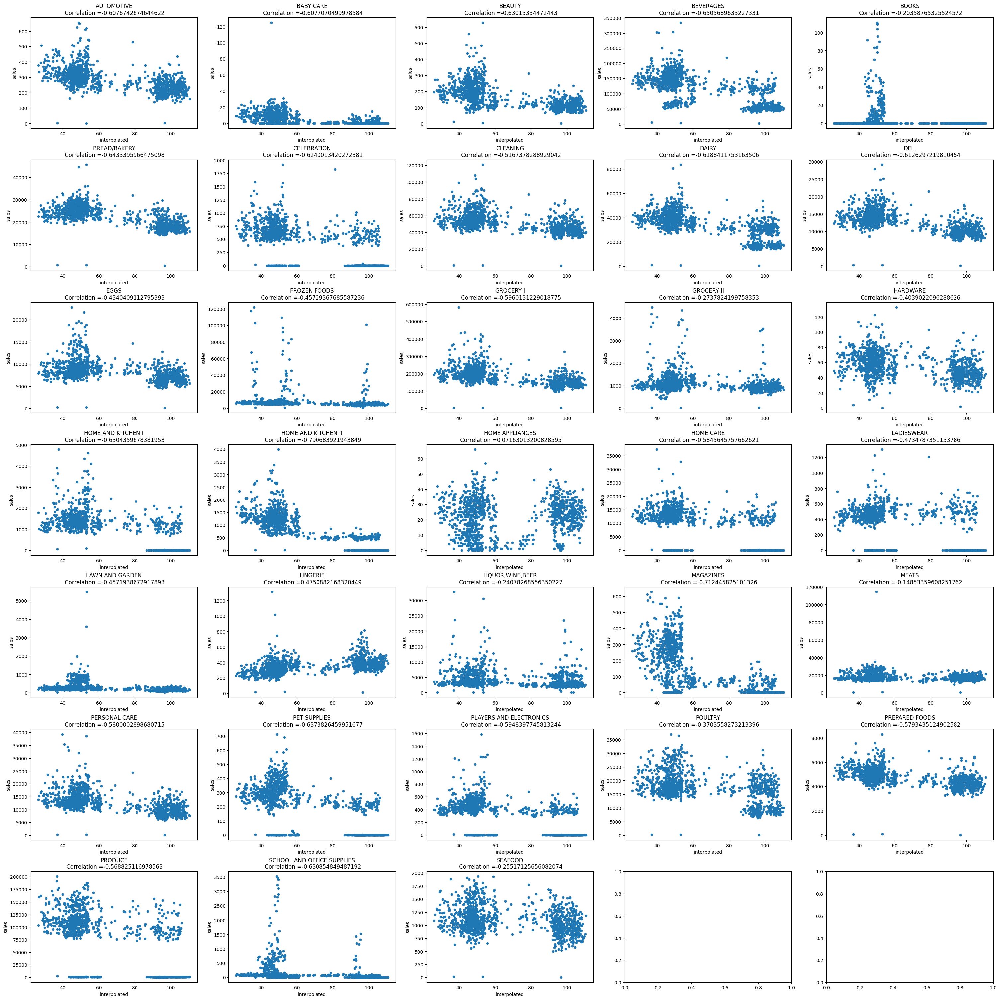

In [18]:
c=train_oil.family.unique()
c=train_oil.groupby('family').corr(method='spearman').reset_index()
c=c[c['level_1']=='sales'][['family','interpolated']]

fig,axes=plt.subplots(7,5,figsize=(30,30), layout="constrained" )
for i,name in enumerate(c.family):
   
    if i<5:
        train_oil[train_oil.family==name].plot.scatter(x='interpolated',y='sales',ax=axes[0,i])
        axes[0,i].set_title(name+'\n Correlation ='+ str(c[c.family==name].interpolated.iloc[0]))
    if i>=5 and i<10:
        train_oil[train_oil.family==name].plot.scatter(x='interpolated',y='sales',ax=axes[1,i-5])
        axes[1,i-5].set_title(name+'\n Correlation ='+ str(c[c.family==name].interpolated.iloc[0]))
    if i>=10 and i<15:
        train_oil[train_oil.family==name].plot.scatter(x='interpolated',y='sales',ax=axes[2,i-10])
        axes[2,i-10].set_title(name+'\n Correlation ='+ str(c[c.family==name].interpolated.iloc[0]))    
    if i>=15 and i<20:
        train_oil[train_oil.family==name].plot.scatter(x='interpolated',y='sales',ax=axes[3,i-15])
        axes[3,i-15].set_title(name+'\n Correlation ='+ str(c[c.family==name].interpolated.iloc[0]))
    if i>=20 and i<25:
        train_oil[train_oil.family==name].plot.scatter(x='interpolated',y='sales',ax=axes[4,i-20])
        axes[4,i-20].set_title(name+'\n Correlation ='+ str(c[c.family==name].interpolated.iloc[0]))
    if i>=25 and i<30:
        train_oil[train_oil.family==name].plot.scatter(x='interpolated',y='sales',ax=axes[5,i-25])
        axes[5,i-25].set_title(name+'\n Correlation ='+ str(c[c.family==name].interpolated.iloc[0]))
    if i>=30 and i<35:
        train_oil[train_oil.family==name].plot.scatter(x='interpolated',y='sales',ax=axes[6,i-30])
        axes[6,i-30].set_title(name+'\n Correlation ='+ str(c[c.family==name].interpolated.iloc[0]))

In [19]:
a=train.groupby(['date','store_nbr']).sales.sum().reset_index()
px.line(a,x='date',y='sales',color='store_nbr')

By clicking on the store nbr in above chart we can isolate the chart and thus can observe if there was 0 sales or not.

* store opened 
* 20 12 feb 2015
* 21 18 july 2015
* 22 07 oct 2015
* 29 19 march 2015
* 36 08 may 2013
* 42 17 aug 2015
* 52 19 april 2017
* 53 28 may 2014

In [20]:
print(train.shape)
train=train[~((train.store_nbr==20) & (train.date<="2015-04-20"))]
train=train[~((train.store_nbr==21) & (train.date<="2015-07-18"))]
train=train[~((train.store_nbr==22) & (train.date<="2015-10-07"))]
train=train[~((train.store_nbr==29) & (train.date<="2015-03-19"))]
train=train[~((train.store_nbr==36) & (train.date<="2013-05-08"))]
train=train[~((train.store_nbr==42) & (train.date<="2015-08-17"))]
train=train[~((train.store_nbr==52) & (train.date<="2017-06-19"))]
train=train[~((train.store_nbr==53) & (train.date<="2014-05-28"))]
train.shape

(3000888, 6)


(2776389, 6)

Some stores do not sell some product at all. There forecasting will be zero for next 15 days. Need to separate an dmerge with the prediction file.

In [21]:
c=train.groupby(['store_nbr','family']).sales.sum().reset_index()
c=c[c.sales==0]
c

,store_nbr,family,sales
1,1,BABY CARE,0.00
268,9,BOOKS,0.00
301,10,BOOKS,0.00
334,11,BOOKS,0.00
367,12,BOOKS,0.00
397,13,BABY CARE,0.00
400,13,BOOKS,0.00
433,14,BOOKS,0.00
449,14,LAWN AND GARDEN,0.00
466,15,BOOKS,0.00


merge zero pred data with date inner join 1=1

In [22]:
date_range=pd.DataFrame(pd.date_range('2017-08-16','2017-08-31'))
date_range=date_range.assign(a='1')
c=c.assign(a='1')

zero_pred = pd.merge(date_range,c,how='inner',on='a' )
print(zero_pred.shape)
zero_pred[zero_pred.store_nbr==1]

(848, 5)


,0,a,store_nbr,family,sales
0,2017-08-16,1,1,BABY CARE,0.00
53,2017-08-17,1,1,BABY CARE,0.00
106,2017-08-18,1,1,BABY CARE,0.00
159,2017-08-19,1,1,BABY CARE,0.00
212,2017-08-20,1,1,BABY CARE,0.00
265,2017-08-21,1,1,BABY CARE,0.00
318,2017-08-22,1,1,BABY CARE,0.00
371,2017-08-23,1,1,BABY CARE,0.00
424,2017-08-24,1,1,BABY CARE,0.00
477,2017-08-25,1,1,BABY CARE,0.00


Some products are not bought by the customer for long time excluding the seasonality. Need to look in last 60 days if the product was bought of course excluding the seasonality trend.

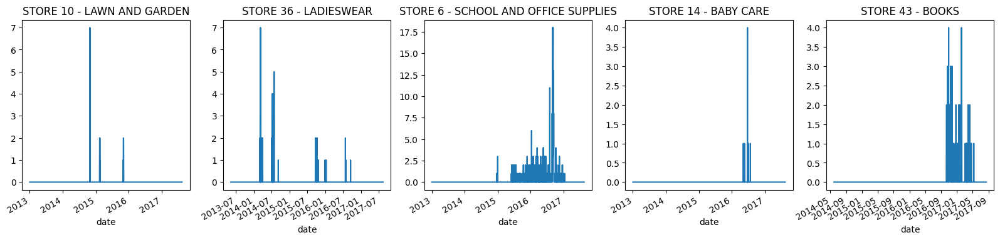

In [23]:
fig, ax = plt.subplots(1,5, figsize = (20,4))
train[(train.store_nbr == 10) & (train.family == "LAWN AND GARDEN")].set_index("date").sales.plot(ax = ax[0], title = "STORE 10 - LAWN AND GARDEN")
train[(train.store_nbr == 36) & (train.family == "LADIESWEAR")].set_index("date").sales.plot(ax = ax[1], title = "STORE 36 - LADIESWEAR")
train[(train.store_nbr == 6) & (train.family == "SCHOOL AND OFFICE SUPPLIES")].set_index("date").sales.plot(ax = ax[2], title = "STORE 6 - SCHOOL AND OFFICE SUPPLIES")
train[(train.store_nbr == 14) & (train.family == "BABY CARE")].set_index("date").sales.plot(ax = ax[3], title = "STORE 14 - BABY CARE")
train[(train.store_nbr == 53) & (train.family == "BOOKS")].set_index("date").sales.plot(ax = ax[4], title = "STORE 43 - BOOKS")
plt.show()

In [24]:
a = train.set_index("date").groupby("family").resample("D").sales.sum().reset_index()
px.line(a, x = "date", y= "sales", color = "family", title = "Daily total sales of the family")

In [25]:
a = train.groupby("family").sales.mean().sort_values(ascending = False).reset_index()
px.bar(a, y = "family", x="sales", color = "family", title = "Which product family preferred more?")

Onpromotion relation with sales.

In [26]:
c=train[['onpromotion','sales']]
c.corr(method='spearman')


,onpromotion,sales
onpromotion,1.00,0.53
sales,0.53,1.00


Holidays data

In [27]:
holidays=pd.read_csv('/kaggle/input/store-sales-time-series-forecasting/holidays_events.csv')
holidays[(holidays.type=='Transfer')]
holidays.groupby(['type','transferred']).count().reset_index()

,type,transferred,date,locale,locale_name,description
0,Additional,False,51,51,51,51
1,Bridge,False,5,5,5,5
2,Event,False,56,56,56,56
3,Holiday,False,209,209,209,209
4,Holiday,True,12,12,12,12
5,Transfer,False,12,12,12,12
6,Work Day,False,5,5,5,5


* Holiday type=
['Holiday', 'Transfer', 'Additional', 'Bridge', 'Work Day', 'Event']
* locale type =['Local', 'Regional', 'National']
*locale_name =['Manta', 'Cotopaxi', 'Cuenca', 'Libertad', 'Riobamba', 'Puyo',
       'Guaranda', 'Imbabura', 'Latacunga', 'Machala', 'Santo Domingo',
       'El Carmen', 'Cayambe', 'Esmeraldas', 'Ecuador', 'Ambato',
       'Ibarra', 'Quevedo', 'Santo Domingo de los Tsachilas',
       'Santa Elena', 'Quito', 'Loja', 'Salinas', 'Guayaquil']

In [28]:
holidays.info()
holidays['date']=pd.to_datetime(holidays.date)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [29]:
holidays=holidays[~((holidays.transferred=='True') & (holidays.type=='Holiday'))].drop('transferred',axis=1)
holidays#

,date,type,locale,locale_name,description
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba
...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3
346,2017-12-23,Additional,National,Ecuador,Navidad-2
347,2017-12-24,Additional,National,Ecuador,Navidad-1
348,2017-12-25,Holiday,National,Ecuador,Navidad


In [30]:
holidays[holidays.locale=='National']

,date,type,locale,locale_name,description
14,2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia
19,2012-10-09,Holiday,National,Ecuador,Independencia de Guayaquil
20,2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil
21,2012-11-02,Holiday,National,Ecuador,Dia de Difuntos
22,2012-11-03,Holiday,National,Ecuador,Independencia de Cuenca
...,...,...,...,...,...
345,2017-12-22,Additional,National,Ecuador,Navidad-3
346,2017-12-23,Additional,National,Ecuador,Navidad-2
347,2017-12-24,Additional,National,Ecuador,Navidad-1
348,2017-12-25,Holiday,National,Ecuador,Navidad


In [31]:
a=pd.merge(train,holidays,how='left', on ='date')
a=pd.get_dummies(a,columns=['type'],dtype='int')
a

,id,date,store_nbr,family,sales,onpromotion,locale,locale_name,description,type_Additional,type_Bridge,type_Event,type_Holiday,type_Transfer,type_Work Day
0,0,2013-01-01,1,AUTOMOTIVE,0.00,0.00,National,Ecuador,Primer dia del ano,0,0,0,1,0,0
1,1,2013-01-01,1,BABY CARE,0.00,0.00,National,Ecuador,Primer dia del ano,0,0,0,1,0,0
2,2,2013-01-01,1,BEAUTY,0.00,0.00,National,Ecuador,Primer dia del ano,0,0,0,1,0,0
3,3,2013-01-01,1,BEVERAGES,0.00,0.00,National,Ecuador,Primer dia del ano,0,0,0,1,0,0
4,4,2013-01-01,1,BOOKS,0.00,0.00,National,Ecuador,Primer dia del ano,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2826676,3000883,2017-08-15,9,POULTRY,438.13,0.00,Local,Riobamba,Fundacion de Riobamba,0,0,0,1,0,0
2826677,3000884,2017-08-15,9,PREPARED FOODS,154.55,1.00,Local,Riobamba,Fundacion de Riobamba,0,0,0,1,0,0
2826678,3000885,2017-08-15,9,PRODUCE,2419.73,148.00,Local,Riobamba,Fundacion de Riobamba,0,0,0,1,0,0
2826679,3000886,2017-08-15,9,SCHOOL AND OFFICE SUPPLIES,121.00,8.00,Local,Riobamba,Fundacion de Riobamba,0,0,0,1,0,0


In [32]:
a[['sales','type_Additional','type_Bridge','type_Event','type_Holiday','type_Transfer','type_Work Day']].corr(method='spearman')

,sales,type_Additional,type_Bridge,type_Event,type_Holiday,type_Transfer,type_Work Day
sales,1.00,0.02,0.00,0.02,-0.01,0.01,-0.00
type_Additional,0.02,1.00,-0.01,-0.03,-0.05,-0.01,-0.01
type_Bridge,0.00,-0.01,1.00,-0.01,-0.01,-0.00,-0.00
type_Event,0.02,-0.03,-0.01,1.00,-0.06,-0.01,-0.01
type_Holiday,-0.01,-0.05,-0.01,-0.06,1.00,-0.02,-0.02
type_Transfer,0.01,-0.01,-0.00,-0.01,-0.02,1.00,-0.00
type_Work Day,-0.00,-0.01,-0.00,-0.01,-0.02,-0.00,1.00


In [33]:
a['holidays']=a['type_Additional']+a['type_Bridge']+a['type_Event']+a['type_Holiday']+a['type_Transfer']
a[['sales','holidays']].corr(method='spearman')

,sales,holidays
sales,1.00,0.01
holidays,0.01,1.00


It seems holidays doesn't have much impact. So neglecting the holidays data